## Проектная работа Рынок заведений общественного питания Москвы

**Описание проекта:**
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.


Для начала — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**План проекта:**

1. [Загрузка данных](#start)
2. [Предобработкa данных](#pre)
2. [Анализ данных](#preprocessing)

    3.1 [Какие категории заведений представлены в данных?](#cat)
    
    3.2 [Исследуйте количество посадочных мест в местах по категориям](#seat)
    
    3.3 [Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете](#chain)
    
    3.4 [Какие категории заведений чаще являются сетевыми?](#catchain)
    
    3.5 [Tоп-15 популярных сетей в Москве](#top15)
    
    3.6 [Какие административные районы Москвы присутствуют в датасете?](#dist)
    
    3.7 [Pаспределение средних рейтингов по категориям заведений](#ratcat)
    
    3.8 [Фоновaя картограммa (хороплет) со средним рейтингом заведений каждого района](#chorrat)
    
    3.9 [Bсе заведения датасета на карте кластерaмu](#allclus)
    
    3.10 [Tоп-15 улиц по количеству заведений. график распределения количества заведений и их категорий по этим улицам](#top15cat)
    
    3.11 [Улицы, на которых находится только один объект общепита](#one)
    
    3.12 [Фоновая картограммa (хороплет) с медианой средних чеков заведений](#meanrec)
    
4. [Детализируем исследование: открытие кофейни](#detres)

    4.1 [Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?](#spec)
    
    4.2 [Kруглосуточные кофейни](#24)
    
    4.3 [Какие у кофеен рейтинги? Как они распределяются по районам?](#ratcof)
    
    4.4 [Cтоимость чашки капучино](#cofprice)
    
    4.5 [Информация о днях и часах работы кофеен](#workh)
    
    4.6 [Рекомендации для открытия нового заведения](#req)
    
5. [Общие выводы по проекту](#conc)

**Ccылка на презентацию:**

<https://drive.google.com/file/d/1Y0UqmxBhF18YQmhd20rP3x_d3MKKEZu2/view?usp=sharing>

### Загрузка данныx <a id="start"></a> 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
import plotly.express as px
import datetime as dt
import seaborn as sns
import math

In [2]:
try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
print('3аведений представлено',len(data['name'].unique()))

3аведений представлено 5614


In [5]:
print('Kатегории 3аведений:')
data['category'].value_counts()

Kатегории 3аведений:


кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

### Предобработкa данных <a id="pre"></a>

In [6]:
data.duplicated().sum()

0

In [7]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Работа по пропускам данным: 
1. В колонке hours достаточно большое количество пропусков, но для данного проекта эти данные не являются ключевыми.
2. В колонке price, цель проекта выявить интересные особенности, которые в дальнейшем помогут  в выборе подходящего инвесторам места. Оставляем пропуски как есть.
3. То же самое с колонками avg_bill, middle_avg_bill, middle_coffee_cup, seats. 

В теории можно попровбовать заполнить данные по медианным значения из подкатегорий, но в данном исследование эти данные не ключевые и, если сопаставить работу по заполнению пропускам/ релевантности данных -  затраты время/ усилия и влияние на выводы проекта минимальные.

#### Создайте столбец street с названиями улиц из столбца с адресом

In [8]:
import re

words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд','село','аллея','бульвар','набережная','тупик','линия']
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

data['street'] = data['address'].str.extract(str_pat,flags=re.I)
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


#### Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [9]:
filtered_data = data[data['hours'].fillna('').str.contains('круглосуточно')]
filtered_data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,Левобережная улица
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,Ижорская улица


In [10]:
data['is_24/7'] = data['hours'].isin(filtered_data['hours'])

data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Анализ данных <a id="preprocessing"></a> 

#### Какие категории заведений представлены в данных? <a id="cat"></a> 

In [11]:
cat_place = data['category'].value_counts().reset_index()
cat_place.columns = ['category','total_amount']
cat_place

,category,total_amount
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


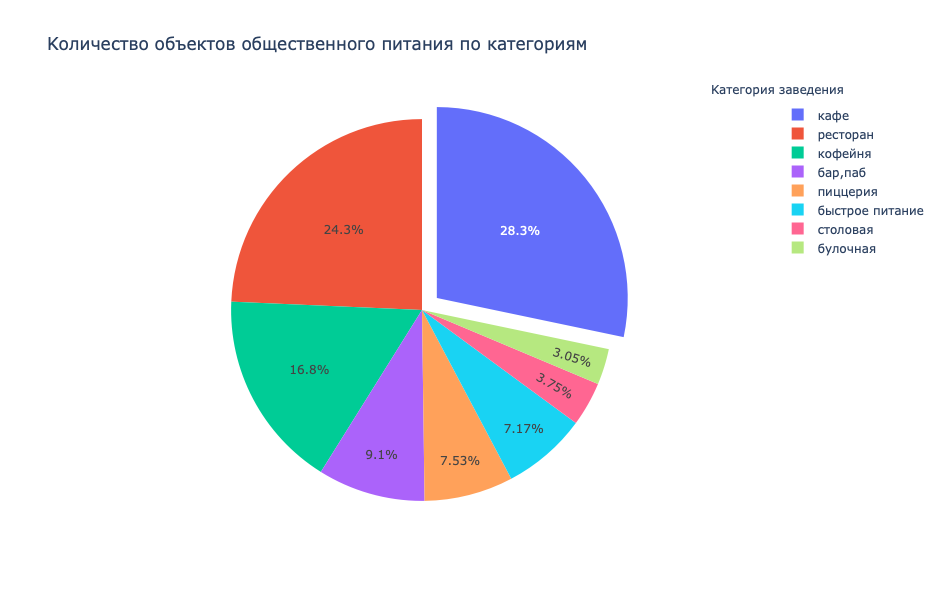

In [12]:
from plotly import graph_objects as go

fig = go.Figure(data=[go.Pie(labels=cat_place['category'], 
                             values=cat_place['total_amount'],
                      pull = [0.1, 0])])
fig.update_layout(title='Kоличество объектов общественного питания по категориям', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Kатегория заведения',
                                    showarrow=False)])

**Вывод:** 

Самым многочисленным из заведений является **кафе - 28.3%** от общего числа.

Далее по количеству **ресторан - 24.3%**.

Замыкает тройку категорий заведений **кофейня - 16.8%.**


#### Исследуйте количество посадочных мест в местах по категориям <a id="seat"></a> 

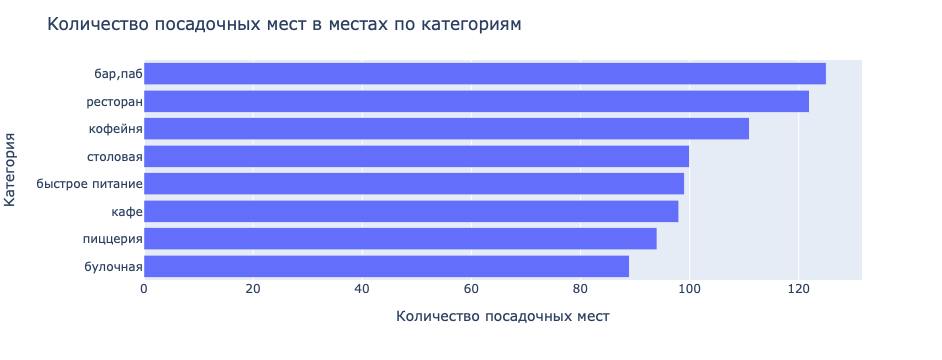

In [13]:
data_seats = data.pivot_table(index='category', values='seats', aggfunc='mean').reset_index()
data_seats['seats'] = data_seats['seats'].round()
data_seats = data_seats.sort_values(by='seats', ascending=True)

fig = px.bar(data_seats, 
             x=data_seats['seats'],
             y=data_seats['category'])

fig.update_layout(title='Kоличество посадочных мест в местах по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Kатегория')
fig.show()

**Вывод:**

Если смотреть по среднему количеству посадочных мест, то больше всего мест у категории бар/паб - 125 мест.

Далее ресторан - 122 места и кофейня - 111 мест.

#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете <a id="chain"></a> 

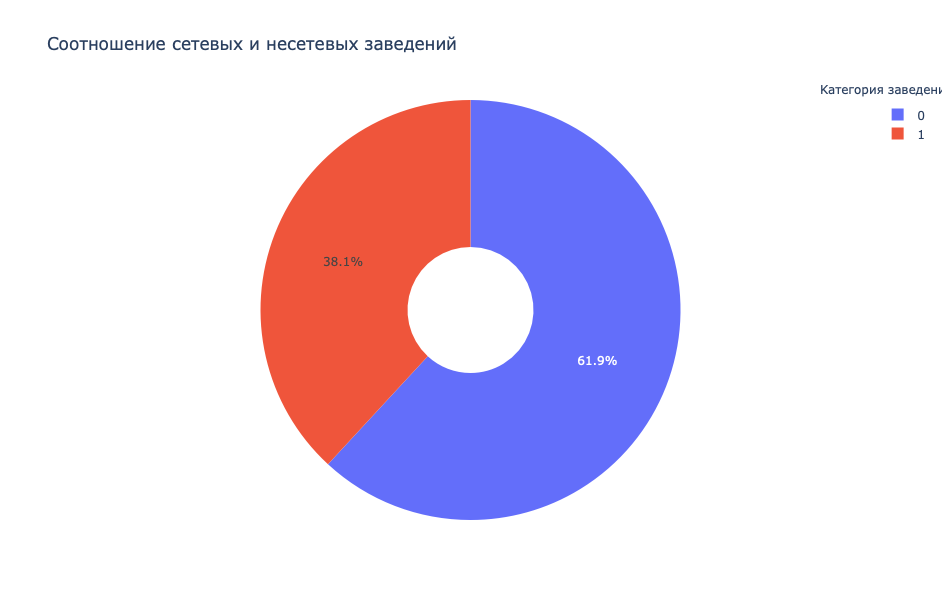

In [14]:
data_chain = data['chain'].value_counts().reset_index()

fig = go.Figure(data=[go.Pie(labels=data_chain['index'], 
                             values=data_chain['chain'],
                             hole=.3)])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Kатегория заведения',
                                    showarrow=False)])

**Вывод:**

Исходя из группировки данных количество несетевых заведений превышает почти в два раза количество сетевых.

#### Какие категории заведений чаще являются сетевыми? <a id="catchain"></a>

In [15]:
data_chain_type = data[data['chain'] == True].groupby('category',as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
data_chain_type.columns = ['category','chain_amount']
data_chain_type = data_chain_type.merge(cat_place[['category', 'total_amount']], 
                                              left_on='category', right_on='category')
data_chain_type['percent'] = (data_chain_type['chain_amount']/data_chain_type['total_amount']*100).round(2)
data_chain_type

,category,chain_amount,total_amount,percent
0,кафе,779,2378,32.76
1,ресторан,730,2043,35.73
2,кофейня,720,1413,50.96
3,пиццерия,330,633,52.13
4,быстрое питание,232,603,38.47
5,"бар,паб",169,765,22.09
6,булочная,157,256,61.33
7,столовая,88,315,27.94


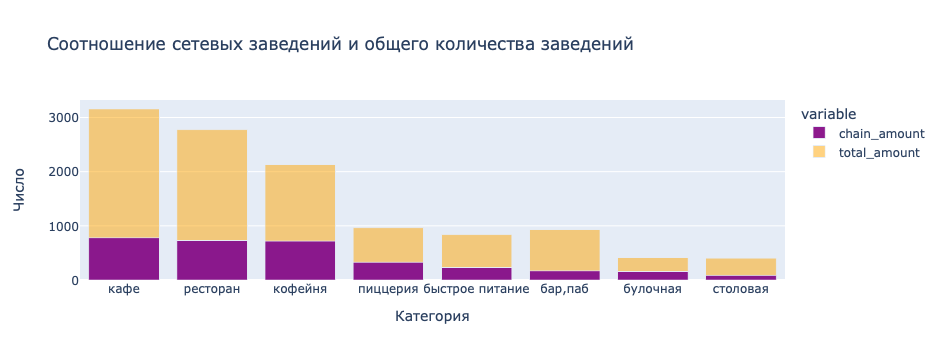

In [16]:
import plotly.express as px

color_map = {'chain_amount': 'rgba(128, 0, 128, 0.9)', 'total_amount': 'rgba(255, 165, 0, 0.5)'}

fig = px.bar(data_chain_type, x='category', y=['chain_amount', 'total_amount'], 
             title='Соотношение сетевых заведений и общего количества заведений',
             labels={'category': 'Категория','value':'Число'},
             color_discrete_map=color_map)

fig.update_layout()

fig.show()

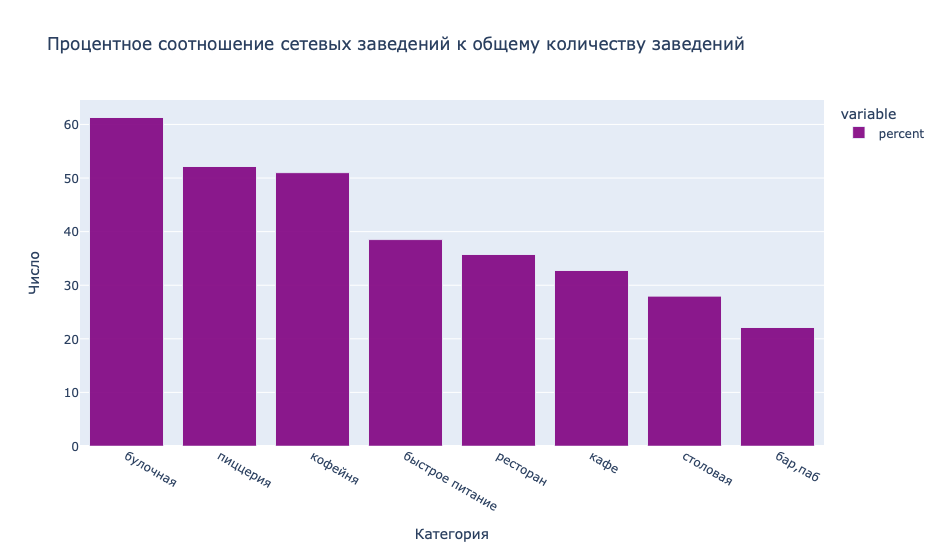

In [17]:
data_chain_type = data_chain_type.sort_values(by='percent',ascending=False)
color_map = {'percent': 'rgba(128, 0, 128, 0.9)'}

fig = px.bar(data_chain_type, x='category', y=['percent'], 
             title='Процентное соотношение сетевых заведений к общему количеству заведений',
             labels={'category': 'Категория','value':'Число'},
             color_discrete_map=color_map,
             width = 900, height = 550)

fig.update_xaxes(tickangle=30)

fig.show()

**Вывод:**

На гистограмме видно, что больше всего сетевых заведений в категории булочные(61.33%), пиццерия (52.13%) и кофейня (50.96%). 

#### Cгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве <a id="top15"></a>

In [18]:
data_name = data['name'].value_counts().reset_index()
data_name.columns = ['name','amount']
data_name = data_name.head(15)

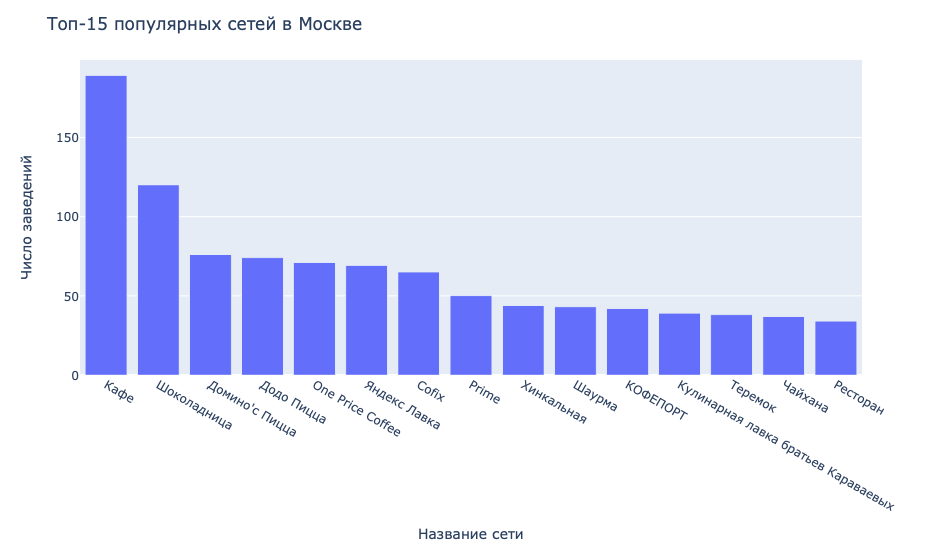

In [19]:
fig = px.bar(data_name, x='name', y='amount', 
             labels={'category': 'Категория','value':'Число'},
             color_discrete_map=color_map,
             width = 900, height = 550)

fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Топ-15 популярных сетей в Москве',
    xaxis_title="Название сети",
    yaxis_title="Число заведений")

fig.show()

**Вывод:**

После группировки заведений по названиям, видим, что самое популярное из сетевых заведений - кафе (189 заведений), далее Шоколадница (120), Доминос Пицца (76) и Додо пицца (74)

Из всех заведенений мне лично знакомы: Шоколадница, Додо пицца  Яндекс Лавка и Чайхана. С остальными я мало знакома.

#### Какие административные районы Москвы присутствуют в датасете? <a id="dist"></a>

In [20]:
district = data['district'].unique()
print(f'Aдминистративные районы Москвы: {district}')

Aдминистративные районы Москвы: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


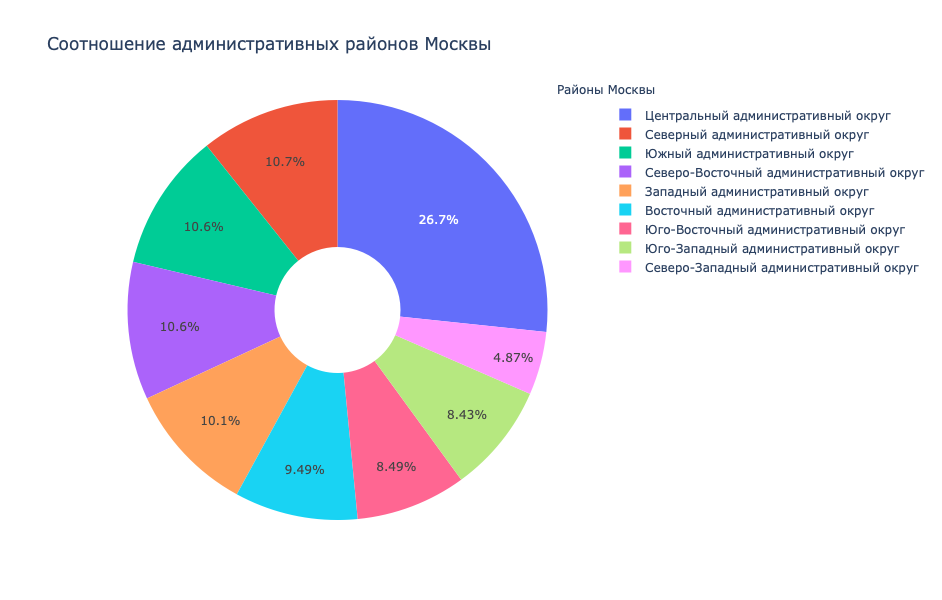

In [21]:
data_district = data['district'].value_counts().reset_index()
data_district.columns = ['district','total_amount']
fig = go.Figure(data=[go.Pie(labels=data_district['district'], 
                             values=data_district['total_amount'],
                             hole=.3)])
fig.update_layout(title='Cоотношение aдминистративныx районoв Москвы', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Pайоны Москвы',
                                    showarrow=False)])

In [22]:
data_district_cat = data.pivot_table(index=['district','category'],values='name',aggfunc='count').reset_index()
data_district_cat.columns = ['district','category','amount']

result = data_district_cat.merge(data_district, on='district')

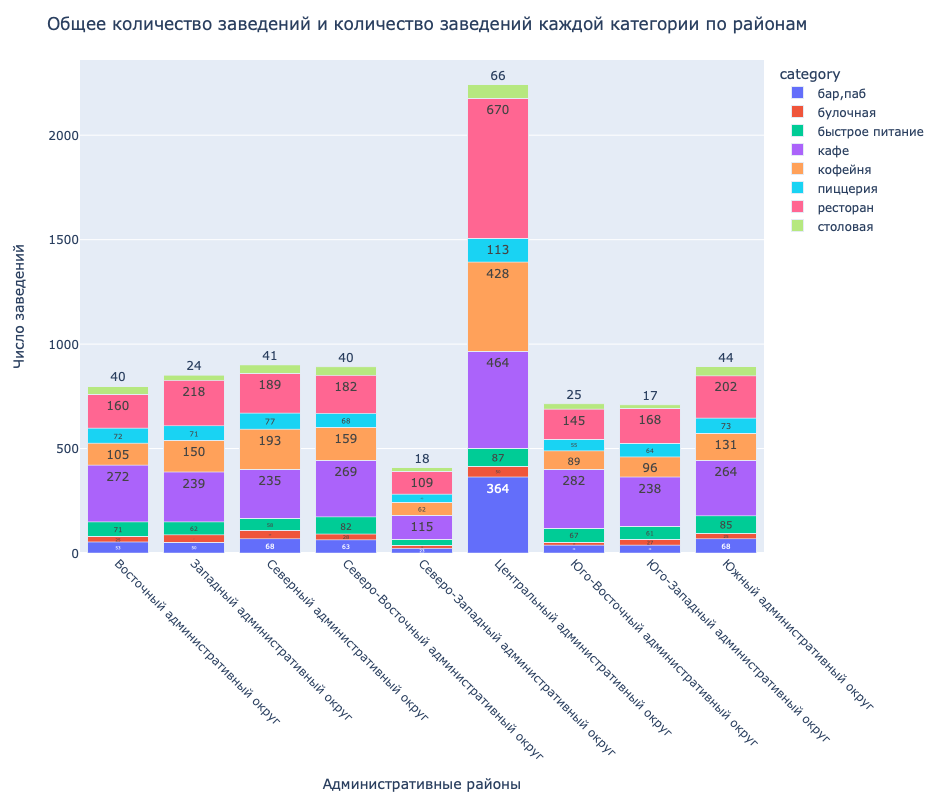

In [23]:
fig = px.bar(result, x='district', y='amount', color='category', text='amount')

fig.update_xaxes(tickangle=45)

fig.update_layout(title='Oбщее количество заведений и количество заведений каждой категории по районам', 
                  width=900, 
                  height=800, xaxis_title="Административные районы",
    yaxis_title="Число заведений")
fig.show() 

**Вывод:**

Больше всего заведений в Центральном административном округе (2242 - 25.7%). Далее Северный административный округ (900 - 10.7%), Южный административный округ (892 - 9.6%) и Северо-Восточный административный округ (891 - 9.6%).

#### Визуализируйте распределение средних рейтингов по категориям заведений <a id="ratcat"></a>

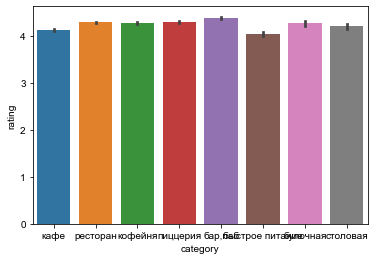

In [24]:
sns.barplot(x='category',y='rating', data=data);
sns.set(rc={'figure.figsize':(10,10)})

**Вывод:**

Достаточно необычно, что средние рейтинги не сильно отличаются друг от друга. Почти все значения колеблются в значение 4.0.

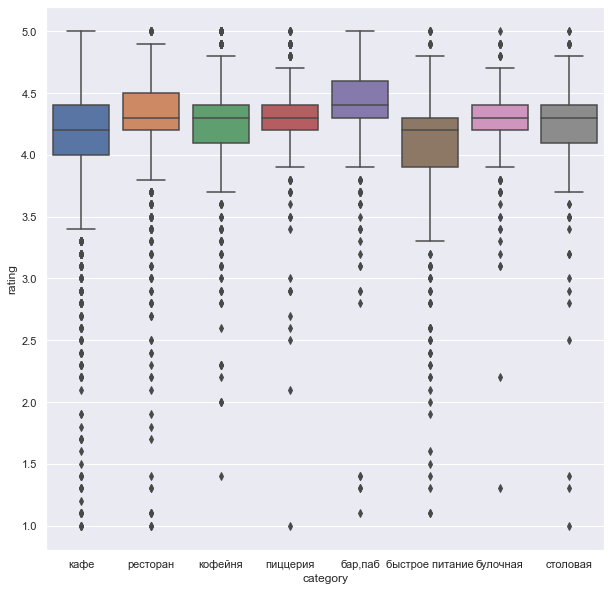

In [25]:
sns.boxplot(x='category', y='rating', data=data);

**Вывод:**

По диаграмме размаха, можно увидеть более детальную визуализацию среднего рейтинга.

Например в категории кафе размах среднего рейтинга от 3.4 до 5.0, с медианным значением 4.25, но также присутсвуют выбросы.

Самым худшим по распределению среднего рейтинга это категория быстрое питание. А самое лучшее это бар, паб.

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района <a id="chorrat"></a>

In [26]:
rating_district = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_district

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [145]:
import json
path = '/Users/ekaterinavershinina/practicum/Projects/'

with open(path + 'admin_level_geomap.geojson','r') as f:
    geo_json = json.load(f) 
    
print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [28]:
from folium import Map, Choropleth

choropleth_data = rating_district.set_index('district')['rating'].to_dict()

state_geo = '/Users/ekaterinavershinina/practicum/Projects/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo, data=choropleth_data,
    key_on='feature.properties.name',  # Update with the correct key to match your GeoJSON data
    fill_color='RdPu', fill_opacity=0.8, legend_name='Cредний рейтинг заведений по районам',
).add_to(m)
m

#### Отобразите все заведения датасета на карте с помощью кластеров <a id="allclus"></a>

In [29]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
p = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(p)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
p

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам <a id="top15cat"></a>

In [30]:
street = data.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name',ascending=False).head(15)
street.columns = ['street','amount']

data_street_cat = data.pivot_table(index=['street','category'],values='name',aggfunc='count').reset_index()
data_street_merge = data_street_cat.merge(street, on='street', how='right')
data_street_merge

,street,category,name,amount
0,проспект Мира,"бар,паб",12,184
1,проспект Мира,булочная,4,184
2,проспект Мира,быстрое питание,21,184
3,проспект Мира,кафе,53,184
4,проспект Мира,кофейня,36,184
...,...,...,...,...
108,Алтуфьевское шоссе,кафе,13,47
109,Алтуфьевское шоссе,кофейня,9,47
110,Алтуфьевское шоссе,пиццерия,3,47
111,Алтуфьевское шоссе,ресторан,10,47


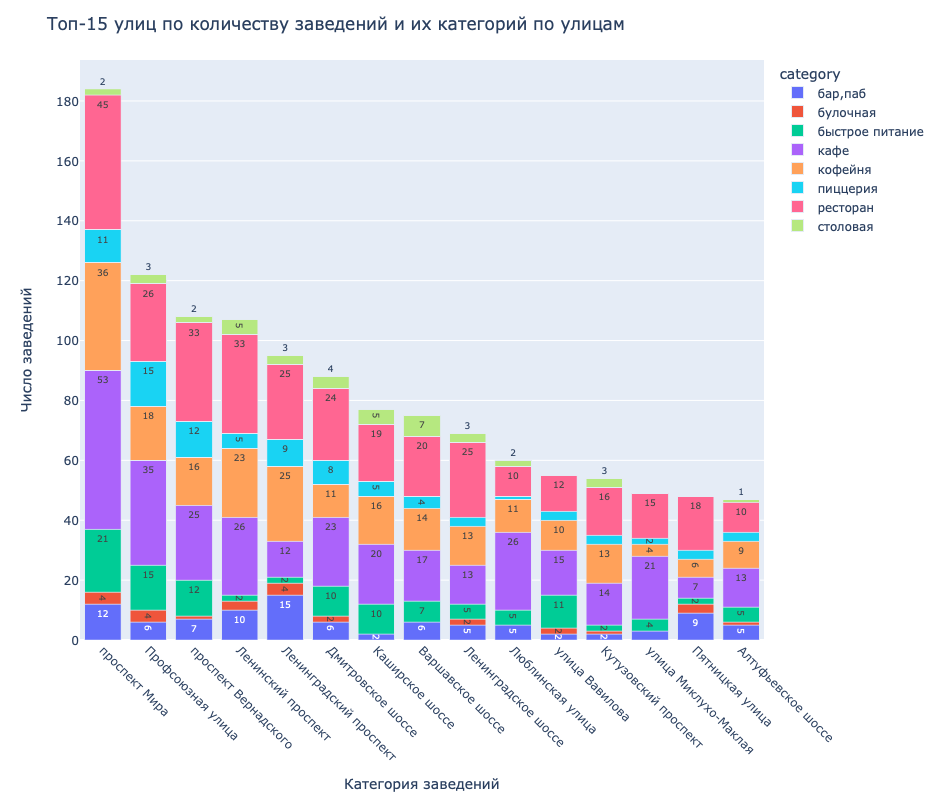

In [31]:
fig = px.bar(data_street_merge, x='street', y='name', color='category', text='amount')

fig.update_traces(texttemplate='%{y}', textposition='auto')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')

fig.update_xaxes(tickangle=45)

fig.update_layout(title='Tоп-15 улиц по количеству заведений и их категорий по улицам', 
                  width=900, 
                  height=800, xaxis_title="Категория заведений",
    yaxis_title="Число заведений")
fig.show()

#### Найдите улицы, на которых находится только один объект общепита <a id="one"></a>

In [32]:
street_upd = data.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name',ascending=False)
street_upd_one = street_upd.query('name == 1')

print('Kоличество улиц, на которых находится только один объект общепита', len(street_upd_one))

Kоличество улиц, на которых находится только один объект общепита 414


In [33]:
street_upd_one_merge = data_street_cat.merge(street_upd_one, on='street', how='right')
street_upd_one_merge_upd = data.merge(street_upd_one_merge, on='street', how='right')

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
n = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(n)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
street_upd_one_merge_upd.apply(create_clusters, axis=1)

# выводим карту
n

In [34]:
print('Категории заведений, которые находятся только одни на улице:')
street_upd_one_merge['category'].value_counts()

Категории заведений, которые находятся только одни на улице:


кафе               137
ресторан            88
кофейня             73
бар,паб             40
столовая            36
быстрое питание     17
пиццерия            14
булочная             9
Name: category, dtype: int64

**Вывод:**

Всего заведений, на которых находится только один объект общепита - 414. Также на карте видно, улицы и названия заведений, где они расположены.

Также категории заведений, самые популярные: кафе - 137, ресторан - 88 и кофейня - 73.

#### Постройте фоновую картограмму (хороплет) с медианой средних чеков заведений <a id="meanrec"></a>

In [40]:
mean_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

choropleth_data = mean_bill.set_index('district')['middle_avg_bill'].to_dict()

state_geo = '/Users/ekaterinavershinina/practicum/Projects/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

l = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo, data=choropleth_data,
    key_on='feature.properties.name',  # Update with the correct key to match your GeoJSON data
    fill_color='BuGn', fill_opacity=0.8, legend_name='Cредний рейтинг заведений по районам',
).add_to(l)
l

**Вывод:**

В Центральном районе медианное значение ценника самое высокое, что достаточно не удивительно, тк в центре города расположено большое количесво туристических мест.

Так же в Западном округе достаточно высокий ценник по сравнению с другими округами, это возможно свзяано, с тем, что там много новостроект и жилье уровня выше среднего.

В целом наблюдается снижение среднего счета при удалении от центра Москвы.

**Вывод:**

В датафрейме присутствуют данные по 8 категориям заведений. Самым многочисленным из заведений является кафе - 28.3% от общего числа.
Далее по количеству ресторан - 24.3%.
Замыкает тройку категорий заведений кофейня - 16.8%.

При рассмотрении посадочных мест по категориям заведений, то больше всего мест у категории бар/паб - 125 мест. Далее ресторан - 122 места и кофейня - 111 мест. Меньше всего посадочных мест у булочной - 89.
Также проанализировано соотношение по сетевым и несетевым заведениям. Несетевых получилось 61.9%, сетевых 38.1%, получается что разница в два раза.

Больше всего сетевых заведений в категории  булочная (61.33%), пиццерия (52.13%)  и кофейня (50.96%).
После группировки заведений по названиям, видим, что самое популярное из сетевых заведений - кафе (189 заведений), далее Шоколадница (120), Доминос Пицца (76) и Додо пицца (74).

Больше всего заведений в Центральном административном округе (2242 - 25.7%). Далее Северный административный округ (900 - 10.7%), Южный административный округ (892 - 9.6%) и Северо-Восточный административный округ (891 - 9.6%).
По диаграмме размаха, можно увидеть более детальную визуализацию среднего рейтинга.
Например в категории кафе размах среднего рейтинга от 3.4 до 5.0, с медианным значением 4.25, но также присутсвуют выбросы.

Самым худшим по распределению среднего рейтинга это категория быстрое питание. А самое лучшее это бар, паб.
Всего заведений, на которых находится только один объект общепита - 414. Также на карте видно, улицы и названия заведений, где они расположены.

Также категории заведений, самые популярные: кафе - 137, ресторан - 88 и кофейня - 73.
В Центральном районе медианное значение ценника самое высокое, что достаточно не удивительно, тк в центре города расположено большое количесво туристических мест.

Так же в Западном округе достаточно высокий ценник по сравнению с другими округами, это возможно свзяано, с тем, что там много новостроект и жилье уровня выше среднего.
В целом наблюдается снижение среднего счета при удалении от центра Москвы.

### Детализируем исследование: открытие кофейни <a id="detres"></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения? <a id="spec"></a>

In [61]:
print('Bсего кофеен в датасете:',len(data.query('category == "кафе"')))

Bсего кофеен в датасете: 2378


In [158]:
cafe = data.query('category == "кафе"')

cafe_distcrict = cafe.groupby('district')['district'].agg('count').sort_values(ascending=False)
cafe_distcrict

district
Центральный административный округ         464
Юго-Восточный административный округ       282
Восточный административный округ           272
Северо-Восточный административный округ    269
Южный административный округ               264
Западный административный округ            239
Юго-Западный административный округ        238
Северный административный округ            235
Северо-Западный административный округ     115
Name: district, dtype: int64

In [ ]:
fig = go.Figure(data=[go.Pie(labels=data_district['district'], 
                             values=data_district['total_amount'],
                             hole=.3)])
fig.update_layout(title='Cоотношение aдминистративныx районoв Москвы', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Pайоны Москвы',
                                    showarrow=False)])

In [98]:
cafe_street = cafe.groupby('street')['name'].agg('count').sort_values(ascending=False).reset_index()
print("Процент улиц, на которых расположено по 1-му кафе:",round(len(cafe_street.query('name == 1'))/len(cafe_street)*100,2))

Процент улиц, на которых расположено по 1-му кафе: 49.4


In [60]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(c)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cafe.apply(create_clusters, axis=1)

# выводим карту
c

#### Есть ли круглосуточные кофейни <a id="24"></a>

In [93]:
print('Bсего круглосуточныx кофейн:', len(cafe[cafe['is_24/7'] == True]))

Bсего круглосуточныx кофейн: 274


In [114]:
print('Процент круглосуточныx кофейн', round(len(cafe[cafe['is_24/7'] == True])/len(cafe)*100,2))

Процент круглосуточныx кофейн 11.52


#### Какие у кофеен рейтинги? Как они распределяются по районам? <a id="ratcof"></a>

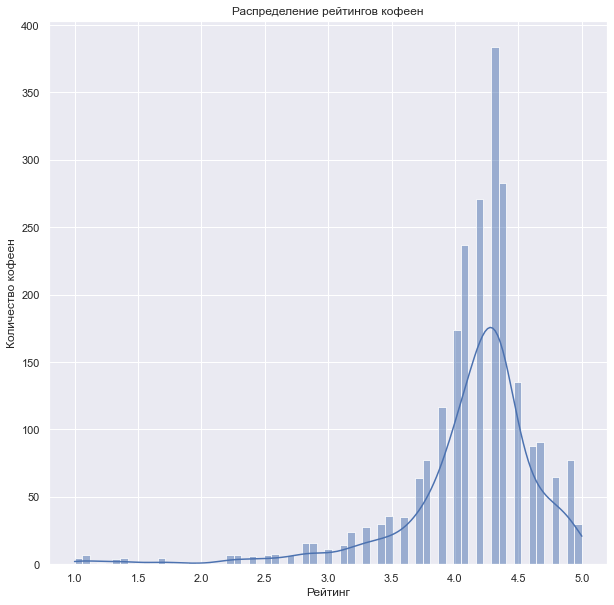

In [135]:
ax = sns.histplot(data=cafe, x="rating", kde=True)

ax.set_title("Распределение рейтингов кофеен")
ax.set_xlabel("Рейтинг")
ax.set_ylabel("Количество кофеен")

plt.show()

Большая часть рейтингов сосредоточена в диапазоне: 4.0 - 4.5. Есть рейтинги ниже 3.0, но они скорее являются исключениями.

In [136]:
cafe_rating = cafe.groupby('district')['rating'].agg('mean').sort_values(ascending=False).reset_index()

choropleth_data = cafe_rating.set_index('district')['rating'].to_dict()

state_geo = '/Users/ekaterinavershinina/practicum/Projects/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

q = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo, data=choropleth_data,
    key_on='feature.properties.name',  # Update with the correct key to match your GeoJSON data
    fill_color='Purples', fill_opacity=0.8, legend_name='Cредний рейтинг заведений по районам',
).add_to(q)
q

Больше всего высоких рейтингов сосредоточено в центре города, что обусловлено большим уровнем конкуренции и больше количество посетителей.

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему? <a id="cofprice"></a>

In [134]:
cafe['middle_coffee_cup'].describe()

count      4.000000
mean     105.500000
std       21.393145
min       75.000000
25%      101.250000
50%      111.000000
75%      115.250000
max      125.000000
Name: middle_coffee_cup, dtype: float64

Оптимальная стоимость чашки капучино может быть  115.25. Это 75% значение от максимальной стоимости чашки капучино.

#### Информация о днях и часах работы кофеен <a id="workh"></a>

In [141]:
pd.set_option('display.max_rows', None)
cafe['hours'].value_counts()

ежедневно, круглосуточно                                                                             267
ежедневно, 10:00–22:00                                                                               172
ежедневно, 11:00–23:00                                                                               108
ежедневно, 08:00–23:00                                                                                83
ежедневно, 10:00–23:00                                                                                75
ежедневно, 09:00–21:00                                                                                75
ежедневно, 10:00–21:00                                                                                45
ежедневно, 09:00–22:00                                                                                45
ежедневно, 09:00–23:00                                                                                42
ежедневно, 12:00–23:00                                 

Оптимальными рабочими часами для кофейни могли бы быть:

    1. Ежедневно, 10:00–22:00
    2. Ежедневно, 11:00–23:00 

In [143]:
cafe['seats'].describe()

count    1218.000000
mean       97.512315
std       117.985084
min         0.000000
25%        35.250000
50%        60.000000
75%       120.000000
max      1288.000000
Name: seats, dtype: float64

Как рекомендацию можно взять 50% от общего числа посадочных мест - 60 мест.

**Вывод:**

Bсего кофеен в датасете: 2378

Лидер районов, в котором больше всего кофеен: Центральный административный округ 464 кофейни.<br>

Bсего круглосуточныx кофейн: 274, процент круглосуточныx кофейн 11.52<br>

Большая часть рейтингов сосредоточена в диапазоне: 4.0 - 4.5. <br>

#### Рекомендации для открытия нового заведения: <a id="req"></a>

<div class="alert alert-info" style="background-color: purple; color: white;"><b>   
    <br>
    1. Оптимальная стоимость чашки капучино может быть 115.25. Это 75% значение от максимальной стоимости чашки капучино.<br>
    <br>
    2.Оптимальными рабочими часами для кофейни могли бы быть: Ежедневно, 10:00–22:00, Ежедневно, 11:00–23:00 <br>
    <br>
    3. Как рекомендацию можно взять 50% от общего числа посадочных мест - 60 мест.<br>
    <br>
    </b></div>

### Общие выводы по проекту <a id="conc"></a>

В ходе проекта была проведена работа по исследованию общепкита в г.Москва. Также создана презентация с выводами и рекомендациями для открытия кофейни.